# Assignment 1
- ECE471 - Fundamentals of Remote Sensing and Earth Observation
- Instructor: Krishna Karra
- Contact: krishna.karra@cooper.edu (also Teams chat)
- *Assigned: Wednesday, January 29 2025*
- *Due: Sunday, February 9 2025 (midnight EST)*

## Motivation & Background
Flag_of_New_Mexico.svg

You are a geospatial data consultant for the Land of Enchantment, the great state of New Mexico. The government is interested in developing geospatial capabilities to eventually monitor land use changes, enforce water rights, analyze climatic conditions over time and more.

As a first step towards fulfilling this vision, the state of New Mexico has acquired a dataset of imagery from the European Space Agency (ESA) over the greater Santa Fe metro area, the state's capital region. Santa Fe, known as the City Different, sits at 7k feet above sea level and enjoys a gorgeous high desert environment nestled in the foothills of the Sangre de Cristo mountains.

Your job as a consultant is to provide a walkthrough of this dataset to the GIS professionals employed by the state, showing the capabilities and possibilities through satellite imagery analysis.

## Assignment Overview
In this problem, you will be analyzing and processing imagery from the Sentinel-2 satellite captured over the greater Santa Fe metro area from 2019 to 2020.

There is a .zip file that contains the contents of this dataset in GeoTIFF format. Below, I have provided you code to download and extract these data into your Colab environment. From Colab, you may easily download these data locally to your machine, for inspection in software such as QGIS and GDAL.

Each GeoTIFF file contains seven bands, in the following order: (1) red, (2) green, (3) blue, (4) nir, (5) swir1, (6) swir2, and (7) alpha. Upon examination of this dataset, you will notice that the spatial extent, resolution and coordinate reference systems vary across the raster files in the dataset.

## Task 1
Examine this dataset, and specifically, do the following:
- (1) Visually inspect the imagery. What do you notice about the dataset? Provide a written description of your findings, with accompanying visuals as appropriate.
- (2) Write a function that takes an input image and visualizes (plots) the image. The function should be able to create a visualization for any single or three-band combination as desired (e.g. RGB, NRG, B, etc.). This function also needs to appropriately scale the underlying data such that it is suitable for visualization and inspection.
- (3) This is the place to add any other notes, observations or analysis here that you find noteworthy or interesting. Do you see any weirdness with the data? What do you notice about what is being captured? What sort of issues do you see that could pose challenges to working with this data?

## Task 2
Now that you have examined this dataset, the next step is to make the stack of imagery suitable for analysis. This means that we need to sure that each raster file has the same spatial extent, resolution and CRS. Your task is to write a script and/or algorithm that accomplishes this.  

By the end of your processing step, you should be able to load the entire stack of data into a 3D numpy stack, where every pixel in (X, Y) space belongs to the same geographic region.

Create a GeoJSON representation of the spatial extent that your newly processed dataset is clipped to.

To accomplish this task, I recommend using either GDAL (Python bindings or command line tools), or rasterio.

Regardless of what tool you use, make sure you write out the processed/corrected GeoTIFF files to disk such that you do not need to re-run the processing every single time.

While I do not expect you to share the entire corrected dataset with me, you need to verify the following for each corrected TIF to ensure they match:
- Size in pixels (this can be a tuple)
- Bounding box (provide the coordinates of the four corners)
- CRS

Think through things like which CRS to use for this particular analysis based on what we learned in class, which spatial resolution is appropriate for this data while keeping the memory footprint low, etc. Always justify your decisions explicitly so I can follow your thought process.

This processed dataset is what we will use for the rest of the assignment.

## Task 3
Now that we have a corrected dataset, often the first thing we want to look at is how the reflectance values are distributed. This will give us better intuition as to what the underlying data represent.

To analyze this, you need to compute a histogram of values across the entire dataset. The end result of this analysis should be a plot, that shows the distribution of values split out by band.

What do you notice from this distribution? How would this distribution affect how you visualize the data, and use it downstream for further analysis?

## Task 4
We now understand some basics about our dataset. Before proceeding further to any kind of temporal analysis, we want to establish a filtering criteria (e.g. figure out which scenes we would like to remove from analysis).

Your method does not have to be complex, but should be programmatic and runnable via code (e.g. you can't just use your eyes to manually filter out scenes). Clearly list which scenes end up being removed, and explain your thought process.

### Task 5
The next task is to filter out clouds and cloud shadows in our data by creating a cloud mask. The cloud mask should be represented as a function that takes an input image, and outputs the corresponding pixel-wise mask that identifies pixels that are either cloudy or in shadow. These pixels, if included in downstream analysis, would corrupt our results, so we want to filter out as many as possible.

Cloud masks can be very simple or very complex. I would recommend starting with something simple that is simple and imperfect (perhaps highly imperfect), complete the rest of the assignment, then come back to this step if time allows.

Provide some commentary on the performance of your cloud mask. Where does it do well? What are the failure modes? How would you improve it if you had more time?

## Task 5
For the remaining scenes that survived the filtering operation from Task 4, you're now tasked with finding the following:
- The scene with the most vegetation
- The scene with the most snow
- The scene with the most clouds
- The scene with the highest overall brightness

For each of the above, your code should print out the corresponding scene ID (these are the filenames from the original dataset, that you should preserve in your processed dataset). Do your results produced by your algorithms match up with visual inspection?

## Task 6
Finally, we want to compute some *composite imagery* from the temporal stack, where we apply various reduction operations on a pixel-wise basis. These images provide us different views over Santa Fe over the year. Compute the following:
- A mean composite
- A median composite
- A minimum composite
- A maximum composite
- A greenest pixel composite
- A medoid composite (do this last as time allows)
- An 85% greenest pixel composite (do this last as time allows)
- A 25% minimum pixel composite (do this last as time allows)

Plot every composite and label it. Any commentary or observations about the composite images are welcome.

Make sure to use your cloud mask in calculation of these composite images! To see how much difference it makes, try calculating a composite image with and without the cloud mask and observe the difference in quailty.

# Tips
- Numpy masked arrays can be helpful. This can be helpful for both working with the alpha band as well as the cloud mask.
- Use functions for bits of code that are re-used often. Are you plotting images all the time? Write a function rather than copy pasting the same code every time.
- The more explanation, discussion and analysis you provide, the more likely you are to get a better score, even if your implementation or answer is not fully correct.
- Focus first on completion of all the tasks rather than spending a ton of time refining one very specific piece of the assignment.
- Memory can be a constraint depending on your implementations. Think critically about how much data is being loaded in to RAM. It can be helpful to save off intermediate steps (especially the output of Task 2). Make sure you are using Colab Pro.

# Submission instructions
- Make a copy of this colaboratory notebook and save it to your Google Drive
- Create sections for each of the subtasks in the notebook and write your code in there
- Along with the code, I expect text and figures to (1) explain your thought process, (2) comment on anything you find notable or interesting, and (3) answer the discussion questions outlined above.
- Share the notebook with me (allow me to comment) when submitting

# Data access
The code below should get you started with downloading the dataset to your colab environment and installing the necessary Python packages. You are expected to use other libraries as necessary (NumPy, Geopandas) to complete the assignment.

In [ ]:
!wget https://storage.googleapis.com/krishna-skytruth-dev/ece471/homework_1/s2_santafe.zip
!unzip -oq s2_santafe.zip

--2025-02-10 00:15:29--  https://storage.googleapis.com/krishna-skytruth-dev/ece471/homework_1/s2_santafe.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.69.207, 64.233.181.207, 74.125.202.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.69.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3327331282 (3.1G) [application/zip]
Saving to: ‘s2_santafe.zip.4’

s2_santafe.zip.4    100%[===================>]   3.10G   107MB/s    in 23s     

2025-02-10 00:15:53 (139 MB/s) - ‘s2_santafe.zip.4’ saved [3327331282/3327331282]



In [ ]:
!pip install rasterio

In [ ]:
import os
from osgeo import gdal
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
import glob
import math
import rasterio.transform
from rasterio.warp import transform_bounds, reproject, Resampling
import json
from shapely.geometry import box, mapping
from rasterio import transform
from tqdm import tqdm
from datetime import datetime
from collections import Counter

# Task 1: Initial Data Inspection & Visualization

## 1.1 - Overview & Observations

In this section we will:

* Count the total number of .tif files.
* Parse the dates from the filenames to tally the number of files per month.
* Plot a histogram of file counts by month so that we can see how the data are distributed over time.
* Print sample metadata from a few files to confirm that images acquired on different days show different spatial information.

In [ ]:
# Print metadata and spatial extent (concise version)
def print_dataset_info(file_path):
    """
    Prints a concise overview of a .tif file:
    - Filename
    - Bounds
    - CRS
    - Width, Height
    """
    with rasterio.open(file_path) as ds:
        print(f"=== {os.path.basename(file_path)} ===")
        print(f"  Bounds: {ds.bounds}")
        print(f"  CRS: {ds.crs}")
        print(f"  Width x Height: {ds.width} x {ds.height}")
        print("")



# Visualize the image using one or more normalization methods
def plot_bands_all_methods(file_path, bands=(1, 2, 3), show_minmax=True, show_percentile=True, show_histeq=False):
    """
    Plot the image using selected normalization methods:
      - Simple Min-Max normalization (optional)
      - Percentile stretch (2nd-98th) (optional)
      - Histogram equalization (optional)
    """
    with rasterio.open(file_path) as dataset:
        # Read and stack the specified bands
        img = np.stack([dataset.read(b) for b in bands], axis=-1).astype(np.float32)

    # Prepare subplots based on which methods are True
    method_titles = []
    method_images = []

    # Method 1: Simple min-max normalization
    if show_minmax:
        img_minmax = (img - img.min()) / (img.max() - img.min() + 1e-6)
        method_titles.append("Min-Max Normalization")
        method_images.append(img_minmax)

    # Method 2: Percentile stretch
    if show_percentile:
        lower = np.percentile(img, 2, axis=(0, 1))
        upper = np.percentile(img, 98, axis=(0, 1))
        img_percentile = (img - lower) / (upper - lower + 1e-6)
        img_percentile = np.clip(img_percentile, 0, 1)
        method_titles.append("Percentile Stretch (2nd-98th)")
        method_images.append(img_percentile)

    # Method 3: Histogram equalization per channel
    if show_histeq:
        img_histeq = np.zeros_like(img)
        for i in range(img.shape[-1]):
            # Add small constant to ensure no negative or zero for equalize_hist
            channel = img[..., i] - img[..., i].min() + 1e-3
            img_histeq[..., i] = exposure.equalize_hist(channel)
        method_titles.append("Histogram Equalization")
        method_images.append(img_histeq)

    # Plot side-by-side
    n_methods = len(method_images)
    fig, axs = plt.subplots(1, n_methods, figsize=(8*n_methods, 8))
    if n_methods == 1:
        axs = [axs]  # Make it iterable

    for ax, im, title in zip(axs, method_images, method_titles):
        ax.imshow(im)
        ax.set_title(title, fontsize=14)
        ax.axis("off")

    file_short = os.path.basename(file_path)
    plt.suptitle(f"{file_short}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Inspect the pixel value distribution (histogram) for a specific band
def inspect_band(file_path, band=1):
    """
    Plots a histogram for one band in the .tif file with the y-axis limited to 4000.
    """
    with rasterio.open(file_path) as ds:
        data = ds.read(band).astype(np.float32)

        plt.figure(figsize=(10, 4))
        plt.hist(data.flatten(), bins=50, color='yellow', edgecolor='black')
        plt.xlim(0, 3500)
        plt.title(f"{os.path.basename(file_path)} (Band {band})")
        plt.xlabel("Pixel Value")
        plt.ylabel("Frequency")
        plt.show()


# Visualize the alpha channel (which indicates valid vs. no-data areas)
def plot_alpha_channel(file_path):
    """
    Visualize the alpha channel (band 7).
    0 = no data, 1 = valid data.
    """
    with rasterio.open(file_path) as ds:
        alpha = ds.read(7).astype(float)

    plt.figure(figsize=(6, 6))
    plt.imshow(alpha, cmap='gray')
    plt.title(f"Alpha Channel - {os.path.basename(file_path)}")
    plt.axis("off")
    plt.show()



def plot_crs_distribution(directory, pattern="*.tif"):
    """
    Plots the distribution of Coordinate Reference Systems (CRS) for all GeoTIFF files in the given directory.

    Parameters:
      directory (str): The directory containing the TIFF files.
      pattern (str): A glob pattern to match files (default is "*.tif").
    """
    file_list = glob.glob(os.path.join(directory, pattern))
    crs_list = []
    for fp in file_list:
        with rasterio.open(fp) as ds:
            crs_list.append(str(ds.crs))

    crs_counter = Counter(crs_list)
    crs_keys = list(crs_counter.keys())
    crs_values = list(crs_counter.values())

    plt.figure(figsize=(8, 5))
    plt.bar(crs_keys, crs_values, color='green', edgecolor='black')
    plt.xlabel("CRS")
    plt.ylabel("Number of Files")
    plt.title("Distribution of Coordinate Reference Systems")
    plt.tight_layout()
    plt.show()



def plot_resolution_distribution(directory, pattern="*.tif"):
    """
    Plots the distributions of X and Y resolutions for all GeoTIFF files in the given directory.

    Parameters:
      directory (str): The directory containing the TIFF files.
      pattern (str): A glob pattern to match files (default is "*.tif").
    """
    file_list = glob.glob(os.path.join(directory, pattern))
    x_res_values = []
    y_res_values = []

    for fp in file_list:
        with rasterio.open(fp) as ds:
            # Calculate resolutions using the bounds and dimensions:
            x_res = (ds.bounds.right - ds.bounds.left) / ds.width
            y_res = (ds.bounds.top - ds.bounds.bottom) / ds.height
            x_res_values.append(round(x_res, 1))
            y_res_values.append(round(y_res, 1))

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.hist(x_res_values, bins=20, color='red', edgecolor='black')
    plt.xlabel("X Resolution")
    plt.ylabel("Number of Files")
    plt.title("Distribution of X Resolution Values")

    plt.subplot(1, 2, 2)
    plt.hist(y_res_values, bins=20, color='blue', edgecolor='black')
    plt.xlabel("Y Resolution")
    plt.ylabel("Number of Files")
    plt.title("Distribution of Y Resolution Values")

    plt.tight_layout()
    plt.show()

## 1.2 - Temporal Variability


Total Number of .tif files: 102



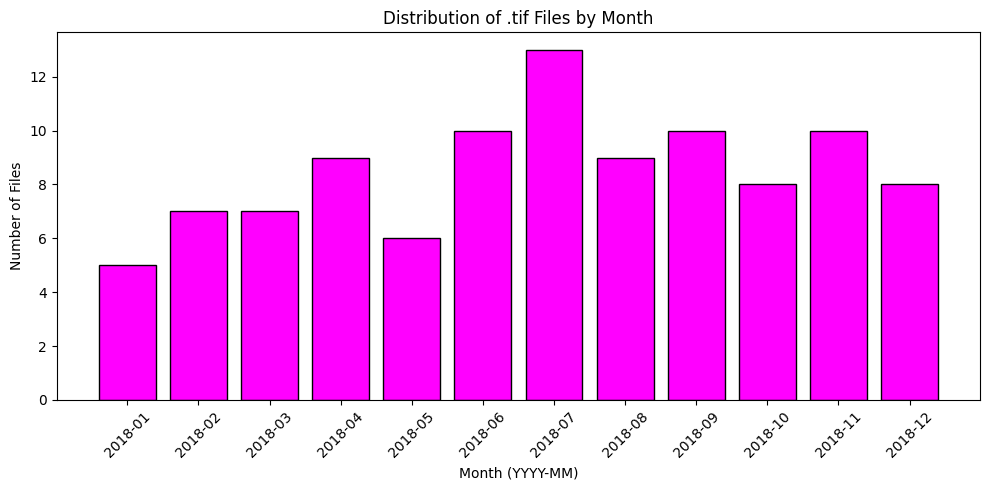

In [ ]:
# List all .tif files
file_list = sorted(glob.glob("s2_santafe/*.tif"))
print(f"Total Number of .tif files: {len(file_list)}\n")

# Tally images by month
month_counts = {}
for fp in file_list:
    base = os.path.basename(fp)
    # Extract the date part (everything after the last underscore, minus the '.tif' extension)
    date_str = base.split('_')[-1].replace('.tif', '')
    try:
        date_obj = datetime.strptime(date_str, "%Y-%m-%d")
        month = date_obj.strftime("%Y-%m")  # Format: "YYYY-MM"
        month_counts[month] = month_counts.get(month, 0) + 1
    except Exception as e:
        print(f"Error parsing date from {base}: {e}")

# Plot histogram of file counts per month
months = sorted(month_counts.keys())
counts = [month_counts[m] for m in months]

plt.figure(figsize=(10, 5))
plt.bar(months, counts, color='magenta', edgecolor='black')
plt.xticks(rotation=45)
plt.xlabel("Month (YYYY-MM)")
plt.ylabel("Number of Files")
plt.title("Distribution of .tif Files by Month")
plt.tight_layout()
plt.show()

The histogram above shows how Sentinel-2 `.tif` files are distributed by month, highlighting some variation in data availability throughout 2018. There’s a clear peak in July, suggesting more images were captured during that time, while other months show a more balanced but fluctuating distribution. Recognizing these patterns is useful for understanding seasonal trends and making sure there’s enough coverage for analysis. Any gaps or clustering in the data could affect modeling and might require interpolation or other data sources to fill in missing information.  

## 1.3 - Coordinate Reference Systems (CRS)

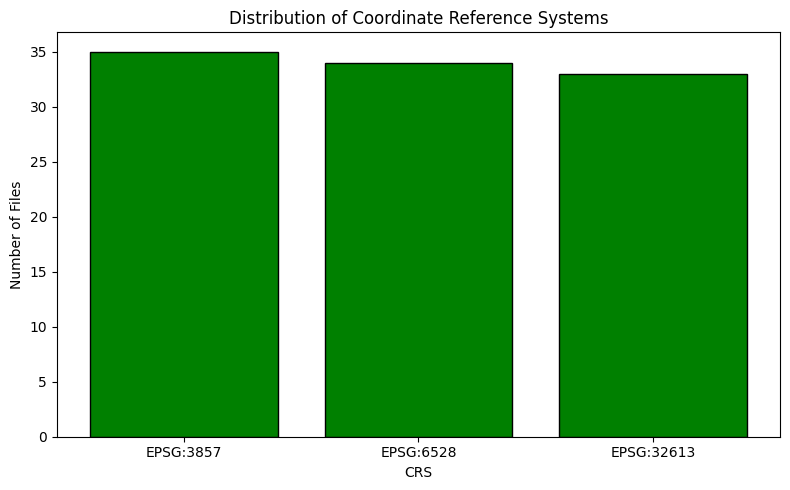

In [ ]:
plot_crs_distribution("s2_santafe")

The bar chart above shows the distribution of different Coordinate Reference Systems (CRS) used in the dataset. Three distinct CRS appear: EPSG:6528, EPSG:3857, and EPSG:32613, each with a fairly similar number of files. This variety suggests that the imagery may have been collected or processed under different spatial reference systems. When working with this dataset, it’s important to keep these differences in mind, as any misalignment between CRS could complicate geospatial analysis and require reprojection to ensure consistency.

## 1.4 - Spatial Coverage and Resolution

Not all images in the dataset cover the same geographic area or have identical resolutions (width and height). While analyzing image dimensions provides some insight into variability, a more meaningful measure is spatial resolution, which represents the actual pixel size.  

For each image, the resolution in the x-direction is calculated as:  

$$
x_{\text{res}} = \frac{\text{bounds.right} - \text{bounds.left}}{\text{width}}
$$

(and similarly for the y-direction).  

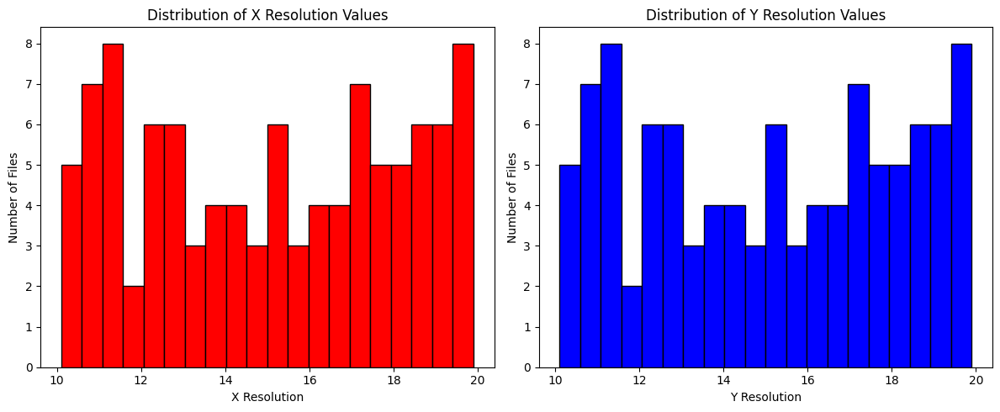

In [ ]:
plot_resolution_distribution("s2_santafe")

The histogram above shows the distribution of resolution values across the dataset, highlighting a range of spatial resolutions. There are noticeable peaks around certain values, indicating that some resolutions are more common than others. The variation in resolution suggests that the dataset includes imagery captured at different levels of detail, which could impact analysis and require resampling or normalization for consistency. Understanding these differences is important when combining images or conducting spatial analyses to ensure uniformity in pixel size.

## 1.5 - Visualization Method

We tested multiple stretching approaches:
- Min-Max Normalization
- Percentile Stretch (2nd–98th)
- Histogram Equalization

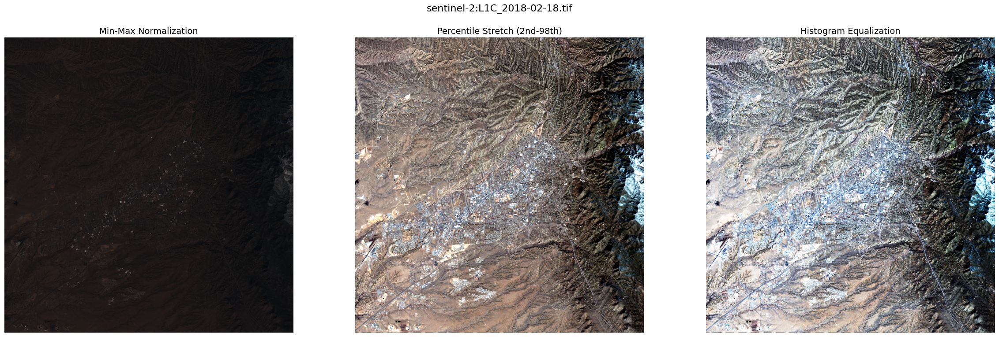

In [ ]:
example_file = "s2_santafe/sentinel-2:L1C_2018-02-18.tif"
plot_bands_all_methods(example_file, bands=(1,2,3),
                       show_minmax=True, show_percentile=True, show_histeq=True)

The image above demonstrates how different stretching methods can significantly alter the appearance of the same satellite image.  

- **Min-Max Normalization**: This method scales pixel values between the minimum and maximum observed values. However, it tends to be overly sensitive to extreme values, often making the image appear too dark or washed out when outliers dominate.  
- **Histogram Equalization**: This approach improves contrast by redistributing pixel intensities, but it can sometimes exaggerate differences, leading to an overly harsh or unnatural appearance.  
- **Percentile Stretch (2nd–98th)**: This method trims extreme values by mapping the 2nd to 98th percentile of pixel values to the display range. This helps reduce the influence of outliers while maintaining a balanced contrast.

**Percentile Stretch** provides the best balance, preserving detail without being overly affected by extreme values. This makes it particularly useful when analyzing images with varying illumination, cloud cover, or shadowing effects.

## 1.6 - Oddities in the Data

While inspecting the dataset, we encountered images where a significant portion appeared completely black (as shown in the **Percentile Stretch** visualization).

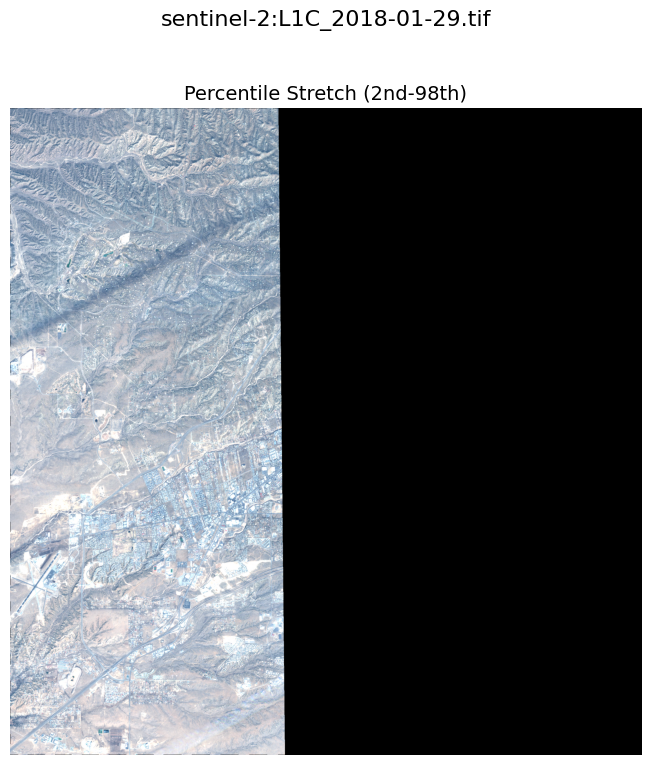

In [ ]:
partial_file = "s2_santafe/sentinel-2:L1C_2018-01-29.tif"
plot_bands_all_methods(partial_file, bands=(1,2,3),
                       show_minmax=False, show_percentile=True, show_histeq=False)

At first glance, this suggested a possible issue with the data or a function we used for visualization. To investigate further, we conducted the following checks:

1. **Pixel Histogram Analysis:**  
   We examined the histogram of pixel values for one of the image bands. The histogram revealed a large spike at **zero**, indicating that a substantial number of pixels were explicitly assigned a value of zero rather than being a result of a visualization error.  

2. **Alpha Channel Inspection:**  
   To confirm whether these black regions were intentional, we plotted the **alpha channel** of the `.tif` file. The alpha channel clearly showed that areas with valid data were marked with a value of **1**, while areas with no data were marked as **0** (matching the black regions in the original visualization).  

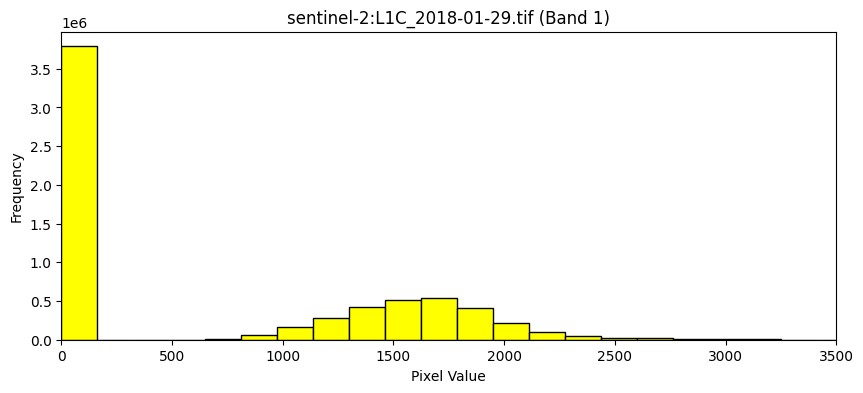

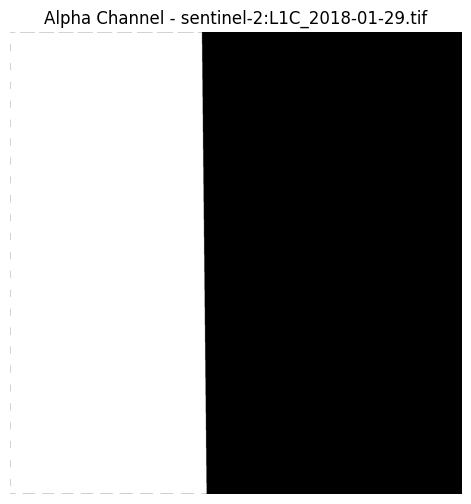

In [ ]:
inspect_band(partial_file, band=1)
plot_alpha_channel(partial_file)

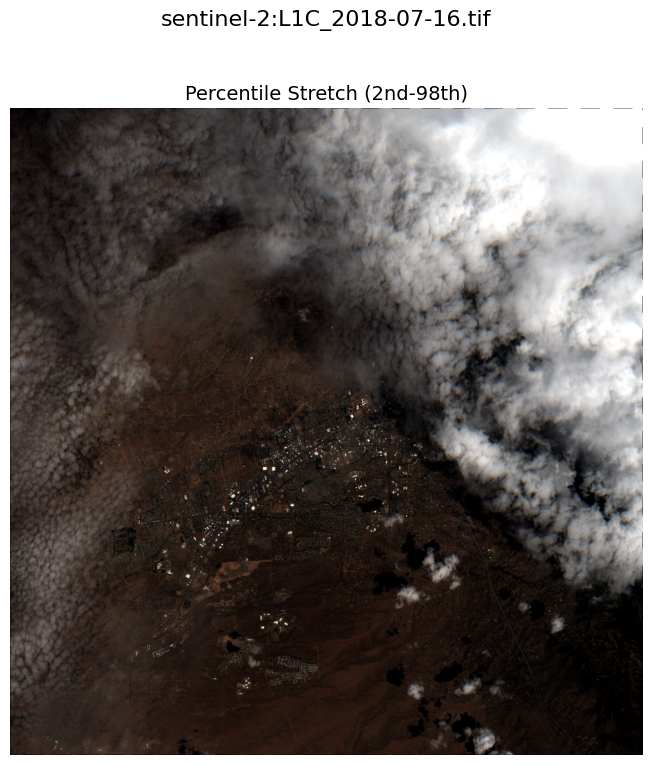

In [ ]:
clouds = "s2_santafe/sentinel-2:L1C_2018-07-16.tif"
plot_bands_all_methods(clouds, bands=(1,2,3),
                       show_minmax=False, show_percentile=True, show_histeq=False)

The image from **July 16, 2018**, shows how clouds can block a significant portion of the landscape. This makes it harder to analyze features on the ground, like vegetation, buildings, or land use changes. Cloud cover is a common challenge in remote sensing, and depending on the type of analysis, it may require filtering out cloudy images or using techniques like cloud masking to get clearer results.  

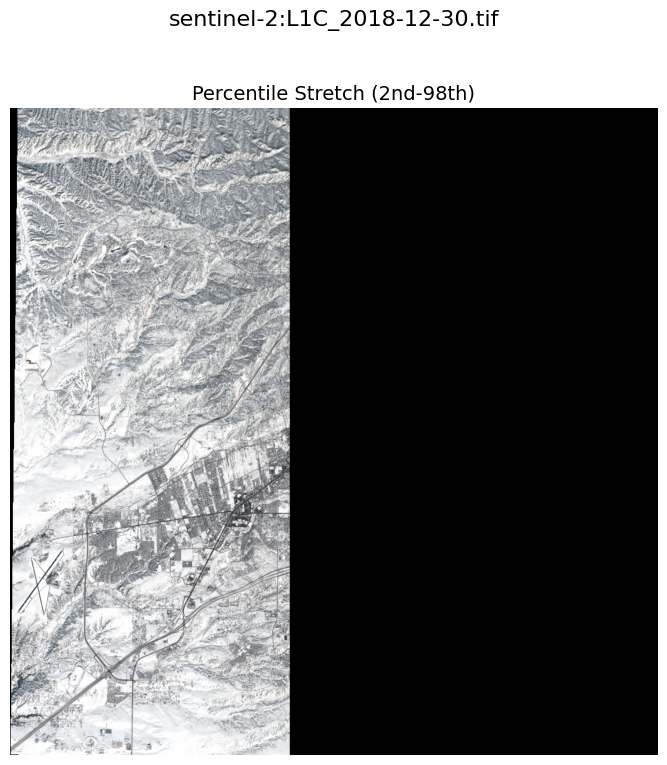

In [ ]:
snow = "s2_santafe/sentinel-2:L1C_2018-12-30.tif"
plot_bands_all_methods(snow, bands=(1,2,3),
                       show_minmax=False, show_percentile=True, show_histeq=False)

The image from **December 30, 2018**, highlights another issue—**snow cover**. If the goal is to study vegetation or land features, snow can interfere by covering up important details, making it tough to tell what’s actually there. This is something to consider when working with time-series data since seasonal changes like snow or droughts can skew the results if they aren’t accounted for.  


# Task 2: Standardizing the Dataset  

To ensure consistency across the dataset, we need to define a **common Coordinate Reference System (CRS)**, a **standard resolution**, and a **uniform spatial extent**. The histograms we generated earlier provide key insights for making these decisions.  

**Choosing a Standard CRS**  

The **CRS distribution histogram** shows that our dataset contains three different CRS: **EPSG:3857, EPSG:32613, and EPSG:6528**, each appearing in similar proportions. To ensure consistency, we need to standardize to a single CRS that is both accurate and widely used.  

- **EPSG:3857 (Web Mercator)** is common for web mapping but distorts areas, making it less suitable for precise spatial analysis.  
- **EPSG:32613 (UTM Zone 13N)** is a good choice since it preserves distances and areas, making it well-suited for accurate analysis in our region.  
- **EPSG:6528** is another option but is less commonly used compared to UTM projections.  

Given these considerations, we propose **standardizing all images to EPSG:32613**, as it provides the best balance between accuracy and usability for spatial analysis.  

**Choosing a Standard Resolution**  

The **resolution histograms** show that our dataset contains a range of resolutions between **10 to 20 meters per pixel**, with noticeable peaks around **10-12 meters per pixel**. To maintain a high level of detail while ensuring consistency, we propose **resampling all images to 10 meters per pixel**. This aligns with the most frequent resolution in the dataset and avoids unnecessary loss of spatial detail.  

**Defining a Standard Bounding Box**  

Since the images in the dataset vary in coverage, we need to determine a common spatial extent. There are two main approaches:  

1. **Intersection (Common Overlapping Area)** – Ensures all images fully cover the selected area but risks losing valuable data from images with wider coverage.  
2. **Union (Full Extent of All Images)** – Preserves all available spatial data, even if some images have missing areas that can be marked as **nodata**.  

To **maximize coverage and avoid unnecessary clipping**, we use the **union of all bounding boxes**, ensuring that no part of the dataset is discarded. This approach is particularly useful for multi-temporal analysis, where having the full spatial extent provides a more complete view over time.  


In [ ]:
def gather_metadata(file_paths, target_crs):
    """
    For each file in file_paths, transform its bounding box to `target_crs`
    and collect metadata in a list of dictionaries.
    """
    metadata_list = []
    for fp in file_paths:
        with rasterio.open(fp) as ds:
            reprojected_bounds = transform_bounds(
                ds.crs,
                target_crs,
                ds.bounds.left,
                ds.bounds.bottom,
                ds.bounds.right,
                ds.bounds.top
            )
            metadata_list.append({
                'file': fp,
                'original_crs': ds.crs,
                'original_bounds': ds.bounds,
                'reprojected_bounds': reprojected_bounds
            })
    return metadata_list



def compute_union_bounds(metadata_list):
    """
    Compute the union of the bounding boxes (in the target CRS) across all files.
    """
    min_left = math.inf
    min_bottom = math.inf
    max_right = -math.inf
    max_top = -math.inf

    for md in metadata_list:
        left, bottom, right, top = md['reprojected_bounds']
        min_left = min(min_left, left)
        min_bottom = min(min_bottom, bottom)
        max_right = max(max_right, right)
        max_top = max(max_top, top)

    return (min_left, min_bottom, max_right, max_top)



def reproject_raster(input_path, output_path, dst_crs, dst_transform, width, height, resampling=Resampling.nearest):
    """
    Reproject and resample the input raster to match the given CRS, transform, and dimensions.
    """
    with rasterio.open(input_path) as src:
        meta = src.meta.copy()
        meta.update({
            'crs': dst_crs,
            'transform': dst_transform,
            'width': width,
            'height': height
        })

        os.makedirs(os.path.dirname(output_path), exist_ok=True)

        with rasterio.open(output_path, 'w', **meta) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=dst_transform,
                    dst_crs=dst_crs,
                    resampling=resampling
                )



def create_geojson_from_bounds(bounds, crs_string, output_geojson_path):
    """
    Create a GeoJSON polygon from the bounding box (in the given CRS).
    """
    left, bottom, right, top = bounds
    polygon_geom = box(left, bottom, right, top)
    feature = {
        "type": "Feature",
        "properties": {
            "crs": crs_string
        },
        "geometry": mapping(polygon_geom)
    }
    feature_collection = {
        "type": "FeatureCollection",
        "features": [feature]
    }
    with open(output_geojson_path, 'w') as f:
        json.dump(feature_collection, f, indent=2)
    print(f"GeoJSON saved to {output_geojson_path}")



def plot_crs_distribution(directory, pattern="*_processed.tif"):
    """
    Plots the distribution of CRS for all processed GeoTIFF files in the given directory.
    """
    from collections import Counter
    file_list = glob.glob(os.path.join(directory, pattern))
    crs_list = []
    for fp in file_list:
        with rasterio.open(fp) as ds:
            crs_list.append(str(ds.crs))
    crs_counter = Counter(crs_list)
    crs_keys = list(crs_counter.keys())
    crs_values = list(crs_counter.values())

    plt.figure(figsize=(8, 5))
    plt.bar(crs_keys, crs_values, color='green', edgecolor='black')
    plt.xlabel("CRS")
    plt.ylabel("Number of Files")
    plt.title("Distribution of Coordinate Reference Systems (Processed Files)")
    plt.tight_layout()
    plt.show()



def plot_resolution_distribution(directory, pattern="*_processed.tif"):
    """
    Plots the distributions of X and Y resolutions for all processed GeoTIFF files in the given directory.
    """
    file_list = glob.glob(os.path.join(directory, pattern))
    x_res_values = []
    y_res_values = []
    for fp in file_list:
        with rasterio.open(fp) as ds:
            x_res = (ds.bounds.right - ds.bounds.left) / ds.width
            y_res = (ds.bounds.top - ds.bounds.bottom) / ds.height
            x_res_values.append(round(x_res, 1))
            y_res_values.append(round(y_res, 1))

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.hist(x_res_values, bins=20, color='red', edgecolor='black')
    plt.xlabel("X Resolution")
    plt.ylabel("Number of Files")
    plt.title("Distribution of X Resolution Values (Processed Files)")

    plt.subplot(1, 2, 2)
    plt.hist(y_res_values, bins=20, color='blue', edgecolor='black')
    plt.xlabel("Y Resolution")
    plt.ylabel("Number of Files")
    plt.title("Distribution of Y Resolution Values (Processed Files)")

    plt.tight_layout()
    plt.show()

Union Bounds in EPSG:32613 : (400441.1862387608, 3935991.231801485, 422140.3614955004, 3958196.691828881)


Reprojecting: 100%|██████████| 102/102 [01:42<00:00,  1.00s/it]

GeoJSON saved to analysis_extent.geojson


In [ ]:
input_directory = "s2_santafe"
file_paths = glob.glob(os.path.join(input_directory, "*.tif"))

target_crs = "EPSG:32613"

# Gather metadata in the target CRS
all_metadata = gather_metadata(file_paths, target_crs)

# Compute the union of all bounding boxes
union_bounds = compute_union_bounds(all_metadata)
print("Union Bounds in", target_crs, ":", union_bounds)

# 5. Decide on a standard resolution to 10 meters per pixel.
desired_res = 10.0

# Calculate width, height, and transform for the union bounding box
left, bottom, right, top = union_bounds
width = int((right - left) / desired_res)
height = int((top - bottom) / desired_res)
dst_transform = transform.from_bounds(left, bottom, right, top, width, height)


# Reproject each raster and save to an output directory
output_dir = "processed_tifs"
try:
    iter_files = tqdm(file_paths, desc="Reprojecting")
except ImportError:
    iter_files = file_paths  # fallback if tqdm not installed

for fp in iter_files:
    base_name = os.path.basename(fp)
    out_path = os.path.join(output_dir, base_name.replace(".tif", "_processed.tif"))
    reproject_raster(
        input_path=fp,
        output_path=out_path,
        dst_crs=target_crs,
        dst_transform=dst_transform,
        width=width,
        height=height,
        resampling=Resampling.nearest
    )

# Create a GeoJSON describing your final bounding box
geojson_path = "analysis_extent.geojson"
create_geojson_from_bounds(union_bounds, target_crs, geojson_path)

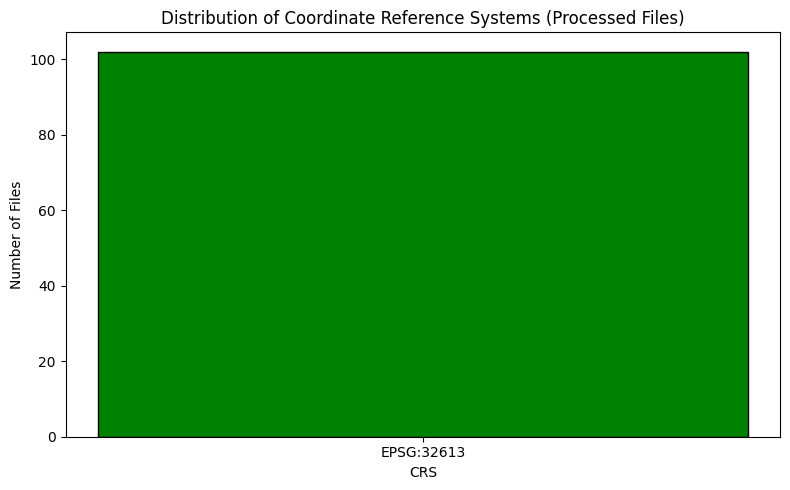

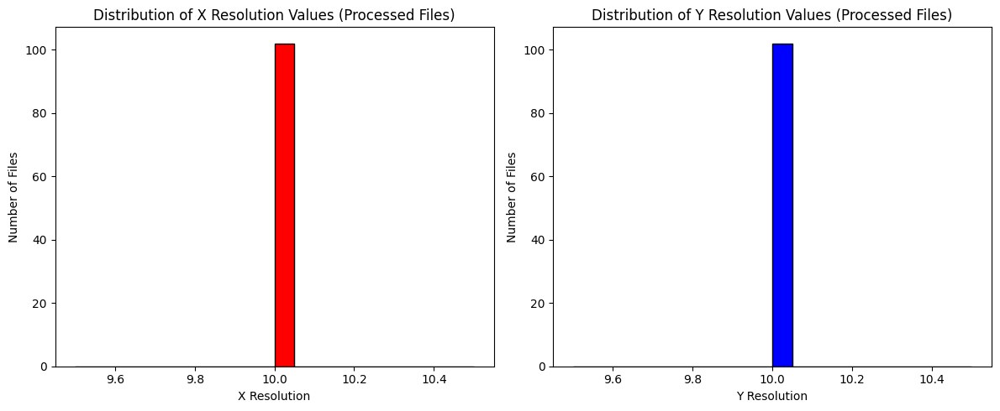

In [ ]:
plot_crs_distribution(output_dir, pattern="*_processed.tif")
plot_resolution_distribution(output_dir, pattern="*_processed.tif")

# Task 3: Analyzing the Reflectance Distribution

In [ ]:
BAND_NAMES = {
    1: 'Red',
    2: 'Green',
    3: 'Blue',
    4: 'NIR',
    5: 'SWIR1',
    6: 'SWIR2',
    7: 'Alpha'
}


def compute_reflectance_histograms(processed_dir, nbins=100, bands_to_exclude=[7]):
    """
    Computes aggregated histograms for each band (except those in bands_to_exclude)
    across all processed rasters in `processed_dir`.

    Returns a dictionary:
       { band_index: {'data': <ndarray of pixel values>,
                      'hist': <histogram array>,
                      'bins': <bin edges>},
         ... }
    """
    # Gather all processed files
    tifs = glob.glob(f"{processed_dir}/*_processed.tif")

    # We'll store pixel values for each band in a dictionary
    band_data = {}

    # First pass: determine the number of bands per image (likely 7)
    with rasterio.open(tifs[0]) as ds:
        count = ds.count
    for b in range(1, count + 1):
        if b not in bands_to_exclude:
            band_data[b] = []

    # Loop through each processed file
    for fp in tqdm(tifs, desc="Accumulating reflectance values"):
        with rasterio.open(fp) as ds:
            # Check if alpha exists in the file (should be band 7)
            alpha_exists = 7 in range(1, ds.count + 1)
            if alpha_exists:
                alpha = ds.read(7).flatten()
                valid_mask = (alpha > 0)  # Only include pixels where alpha > 0

            for b in range(1, ds.count + 1):
                if b not in bands_to_exclude:
                    arr = ds.read(b).flatten().astype(np.float32)
                    # Exclude nodata/invalid pixels based on alpha if available
                    if alpha_exists:
                        arr = arr[valid_mask]
                    band_data[b].append(arr)

    # Concatenate arrays for each band and compute histogram
    band_histograms = {}
    for b, list_of_arrays in band_data.items():
        all_values = np.concatenate(list_of_arrays, axis=0)
        hist, bin_edges = np.histogram(all_values, bins=nbins, range=(0, 10000))
        band_histograms[b] = {
            'data': all_values,
            'hist': hist,
            'bins': bin_edges
        }

    return band_histograms



def print_band_statistics_table(band_histograms):
    """
    Compute and print summary statistics for each band as a formatted table.
    The table includes the band name and key statistics (min, max, mean, median, std dev).
    """
    table_data = []
    headers = ["Band Name", "Min", "Max", "Mean", "Median", "Std Dev"]
    for b in sorted(band_histograms.keys()):
        data = band_histograms[b]['data']
        band_name = BAND_NAMES.get(b, f"Band {b}")
        row = [band_name,
               f"{np.min(data):.2f}",
               f"{np.max(data):.2f}",
               f"{np.mean(data):.2f}",
               f"{np.median(data):.2f}",
               f"{np.std(data):.2f}"]
        table_data.append(row)
    print(tabulate(table_data, headers=headers, tablefmt="github"))



def plot_band_histograms(band_histograms):
    """
    For each band in band_histograms, create a separate histogram plot.
    The y-axis is scaled consistently across all plots for easier comparison.
    """
    # Compute global maximum for y-axis across all histograms
    global_max = max(np.max(hist_info['hist']) for hist_info in band_histograms.values())

    for b in sorted(band_histograms.keys()):
        hist_info = band_histograms[b]
        hist_counts = hist_info['hist']
        bin_edges = hist_info['bins']
        band_name = BAND_NAMES.get(b, f"Band {b}")

        plt.figure(figsize=(8, 6))
        plt.bar(bin_edges[:-1], hist_counts,
                width=bin_edges[1]-bin_edges[0],
                color='grey', edgecolor='black')
        plt.title(f"{band_name} (Band {b}) Histogram")
        plt.xlabel("Reflectance (scaled 0-10000)")
        plt.ylabel("Pixel Count")
        plt.ylim(0, global_max * 1.1)  # set uniform y-axis (10% headroom)
        plt.tight_layout()
        plt.show()

Accumulating reflectance values: 100%|██████████| 102/102 [00:16<00:00,  6.04it/s]


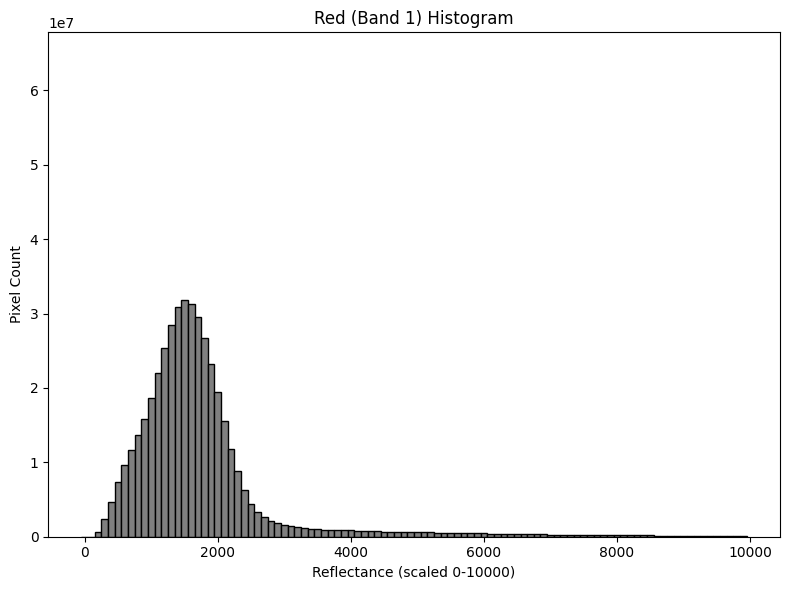

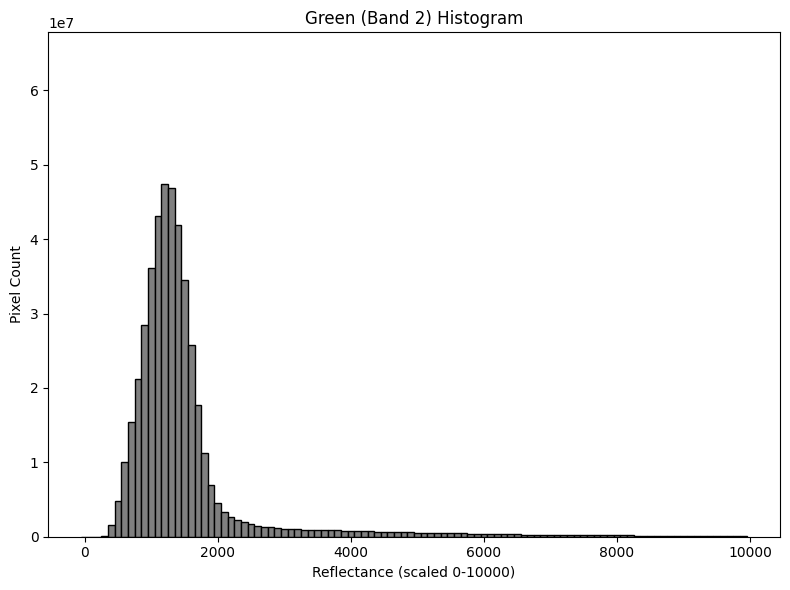

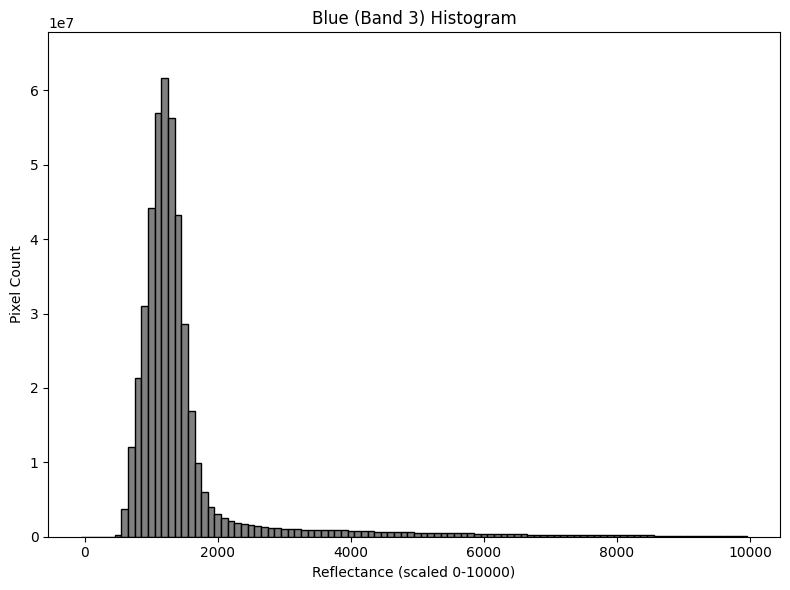

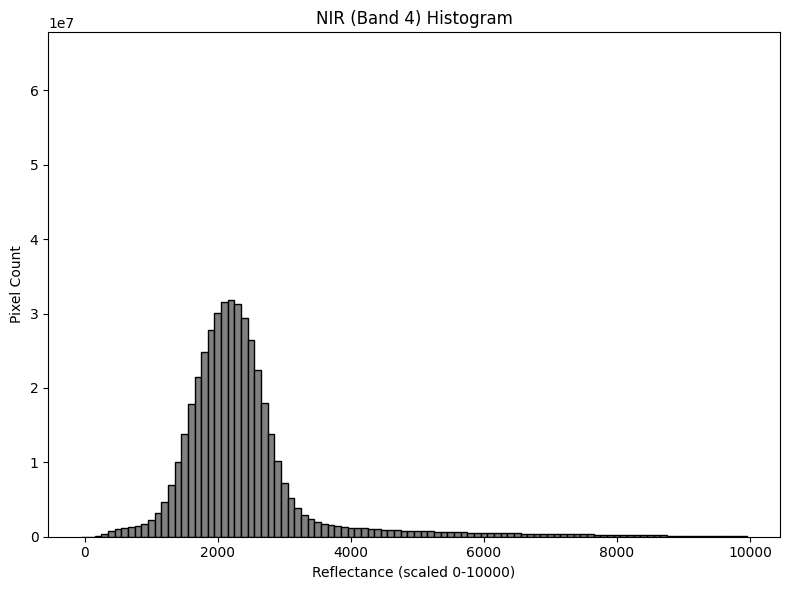

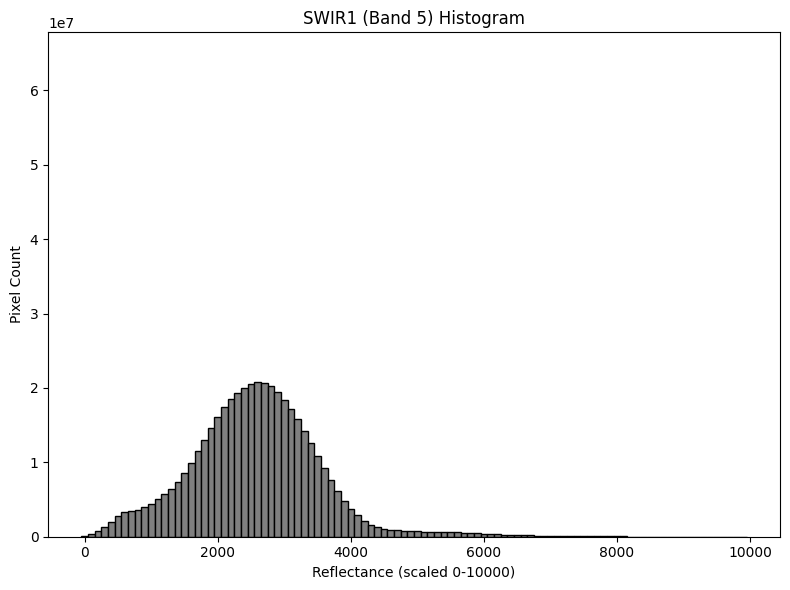

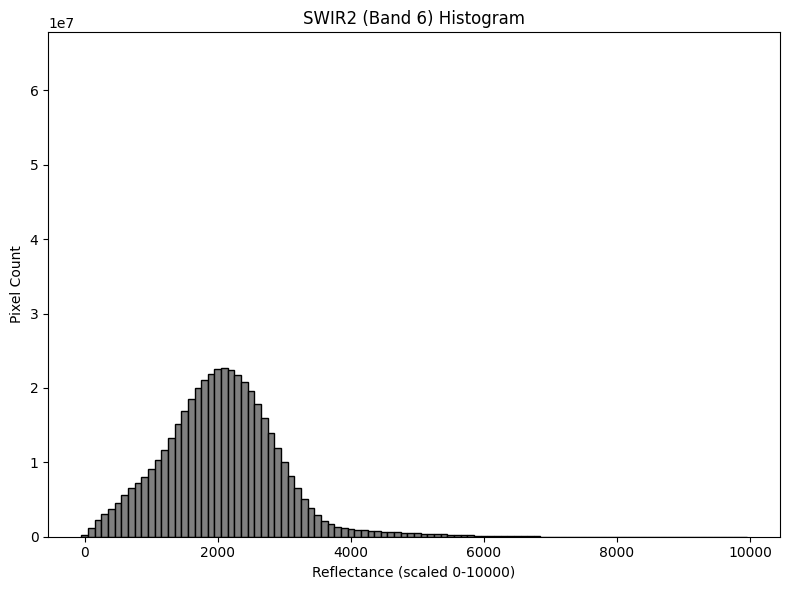

| Band Name   |   Min |   Max |    Mean |   Median |   Std Dev |
|-------------|-------|-------|---------|----------|-----------|
| Red         |     0 | 18515 | 1817.96 |     1595 |   1219.93 |
| Green       |     0 | 18240 | 1576.81 |     1328 |   1122.02 |
| Blue        |     0 | 18315 | 1570.19 |     1285 |   1160.4  |
| NIR         |   100 | 18536 | 2461.63 |     2260 |   1168.06 |
| SWIR1       |     0 | 18516 | 2620.73 |     2608 |    990.89 |
| SWIR2       |     0 | 18381 | 2113.39 |     2097 |    872.07 |


In [ ]:
processed_directory = "processed_tifs"
band_histograms = compute_reflectance_histograms(processed_directory)

plot_band_histograms(band_histograms)

In [ ]:
print_band_statistics_table(band_histograms)

# Task 4: Filtering Scences Programmatically

Scenes with a very low valid data ratio (for example, if less than 50% of pixels are valid) can be flagged for removal from further analysis. This programmatic filtering lets you list the scenes that you will remove and document your decision

# Task 5: Identifying Extreme Cases

In [ ]:
def read_image_bands(file_path, bands):
    """
    Reads the specified bands from the image at file_path.
    If an alpha band (assumed to be band 7) exists, only returns valid pixels.
    Returns a dictionary mapping band numbers to flattened arrays (float32).
    """
    with rasterio.open(file_path) as ds:
        # Check if an alpha band exists (assumed to be band 7)
        alpha_exists = (ds.count >= 7)
        if alpha_exists:
            # Flatten the alpha band so that the valid_mask is 1D
            alpha = ds.read(7).astype(np.float32).flatten()
            valid_mask = (alpha > 0)
        else:
            valid_mask = None

        band_data = {}
        for b in bands:
            # Read and flatten the band
            arr = ds.read(b).astype(np.float32).flatten()
            if valid_mask is not None:
                arr = arr[valid_mask]
            band_data[b] = arr
    return band_data



def compute_ndvi(file_path):
    """
    Computes the average NDVI for the scene.
    NDVI = (NIR - Red) / (NIR + Red)
    Uses: Red (Band 1) and NIR (Band 4)
    """
    bands = [1, 4]
    data = read_image_bands(file_path, bands)
    red = data[1]
    nir = data[4]
    ndvi = (nir - red) / (nir + red + 1e-6)
    return np.nanmean(ndvi)



def compute_snow_fraction(file_path, threshold=0.4):
    """
    Computes the fraction of snow pixels using the Normalized Difference Snow Index (NDSI):
      NDSI = (Green - SWIR1) / (Green + SWIR1)
    Uses: Green (Band 2) and SWIR1 (Band 5).
    Returns the fraction of pixels with NDSI greater than threshold.
    """
    bands = [2, 5]
    data = read_image_bands(file_path, bands)
    green = data[2]
    swir1 = data[5]
    ndsi = (green - swir1) / (green + swir1 + 1e-6)
    snow_pixels = ndsi > threshold
    return np.mean(snow_pixels)



def compute_cloud_fraction(file_path, threshold=6000):
    """
    Computes the fraction of cloud pixels based on visible brightness.
    A pixel is considered cloudy if the mean of its Red, Green, and Blue values exceeds threshold.
    Uses: Red (Band 1), Green (Band 2), Blue (Band 3).
    """
    bands = [1, 2, 3]
    data = read_image_bands(file_path, bands)
    red = data[1]
    green = data[2]
    blue = data[3]
    visible_mean = (red + green + blue) / 3.0
    cloud_pixels = visible_mean > threshold
    return np.mean(cloud_pixels)



def compute_overall_brightness(file_path):
    """
    Computes the overall brightness of the scene as the average reflectance of the visible bands.
    Uses: Red (Band 1), Green (Band 2), Blue (Band 3).
    """
    bands = [1, 2, 3]
    data = read_image_bands(file_path, bands)
    red = data[1]
    green = data[2]
    blue = data[3]
    visible_mean = (red + green + blue) / 3.0
    return np.mean(visible_mean)



def plot_scene_rgb(file_path, title=None):
    """
    Plots an RGB composite of the scene using bands 1 (Red), 2 (Green), and 3 (Blue).
    Applies a simple min-max normalization for display.
    """
    with rasterio.open(file_path) as ds:
        red = ds.read(1).astype(np.float32)
        green = ds.read(2).astype(np.float32)
        blue = ds.read(3).astype(np.float32)

    def normalize(arr):
        arr_min, arr_max = np.min(arr), np.max(arr)
        return (arr - arr_min) / (arr_max - arr_min + 1e-6)

    rgb = np.dstack([normalize(red), normalize(green), normalize(blue)])

    plt.figure(figsize=(8, 8))
    plt.imshow(rgb)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

## 5.1 Most Vegetation

Processing files: 100%|██████████| 102/102 [00:13<00:00,  7.45file/s, Avg NDVI=0.243]



Scene with the most vegetation: processed_tifs/sentinel-2:L1C_2018-09-09_processed.tif (Avg NDVI = 0.243)


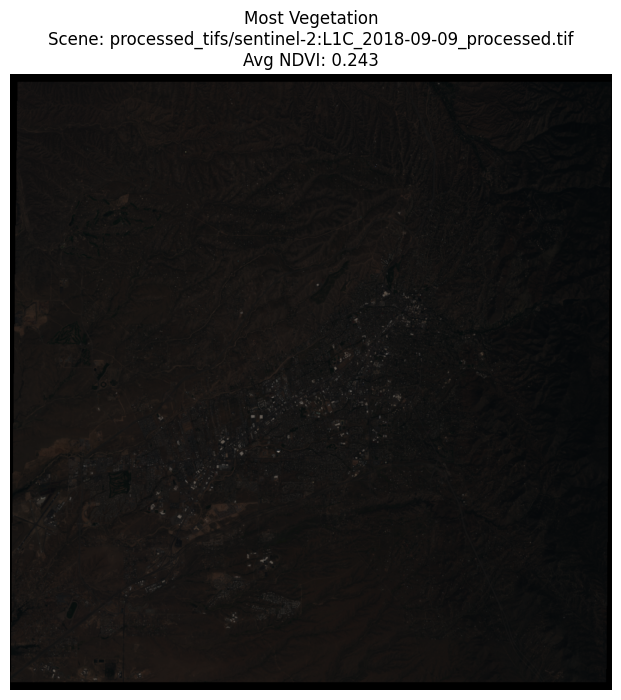

In [ ]:
processed_dir = "processed_tifs"
file_list = glob.glob(f"{processed_dir}/*_processed.tif")

max_ndvi = -np.inf
max_ndvi_file = None

pbar = tqdm(file_list, desc="Processing files", unit="file")
for fp in pbar:
    ndvi_val = compute_ndvi(fp)
    pbar.set_postfix({"Avg NDVI": f"{ndvi_val:.3f}"})
    if ndvi_val > max_ndvi:
        max_ndvi = ndvi_val
        max_ndvi_file = fp
pbar.close()


print(f"\nScene with the most vegetation: {max_ndvi_file} (Avg NDVI = {max_ndvi:.3f})")
plot_scene_rgb(max_ndvi_file, title=f"Most Vegetation\nScene: {max_ndvi_file}\nAvg NDVI: {max_ndvi:.3f}")

## 5.2 Most Snow

Processing files: 100%|██████████| 102/102 [00:12<00:00,  8.08file/s, Snow Fraction=0.000]



Scene with the most snow: processed_tifs/sentinel-2:L1C_2018-12-30_processed.tif (Snow Fraction = 0.995)


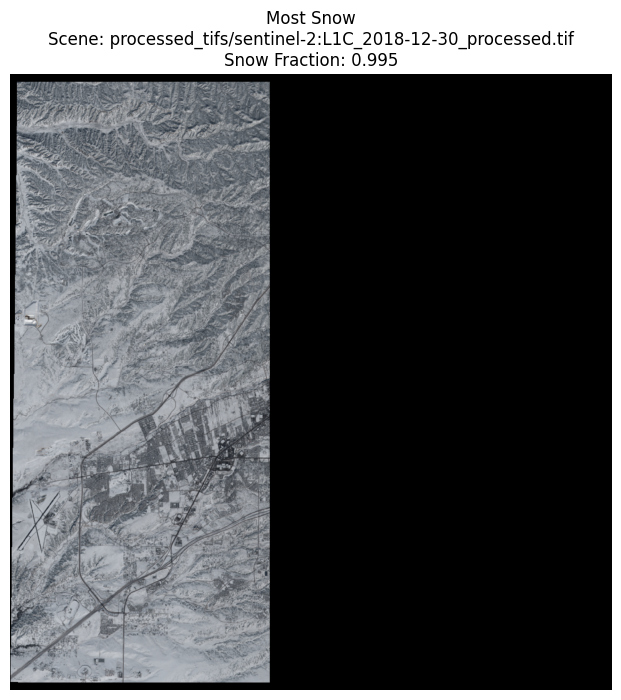

In [ ]:
max_snow_fraction = -np.inf
max_snow_file = None

pbar = tqdm(file_list, desc="Processing files", unit="file")
for fp in pbar:
    snow_frac = compute_snow_fraction(fp, threshold=0.4)
    pbar.set_postfix({"Snow Fraction": f"{snow_frac:.3f}"})
    if snow_frac > max_snow_fraction:
        max_snow_fraction = snow_frac
        max_snow_file = fp
pbar.close()


print(f"\nScene with the most snow: {max_snow_file} (Snow Fraction = {max_snow_fraction:.3f})")
plot_scene_rgb(max_snow_file, title=f"Most Snow\nScene: {max_snow_file}\nSnow Fraction: {max_snow_fraction:.3f}")

## 5.3 Most Clouds

Processing files: 100%|██████████| 102/102 [00:13<00:00,  7.53file/s, Cloud Fraction=0.000]



Scene with the most clouds: processed_tifs/sentinel-2:L1C_2018-03-15_processed.tif (Cloud Fraction = 0.256)


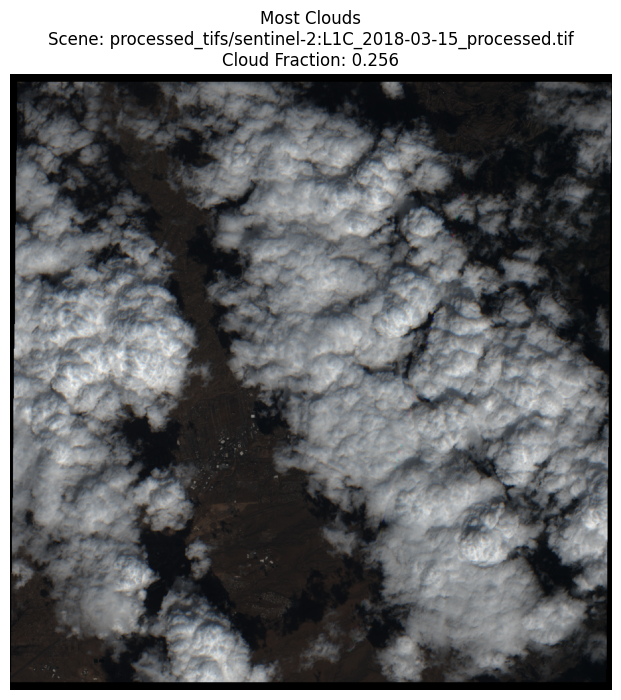

In [ ]:
max_cloud_fraction = -np.inf
max_cloud_file = None

pbar = tqdm(file_list, desc="Processing files", unit="file")
for fp in pbar:
    cloud_frac = compute_cloud_fraction(fp, threshold=8000)
    pbar.set_postfix({"Cloud Fraction": f"{cloud_frac:.3f}"})
    if cloud_frac > max_cloud_fraction:
        max_cloud_fraction = cloud_frac
        max_cloud_file = fp
pbar.close()


print(f"\nScene with the most clouds: {max_cloud_file} (Cloud Fraction = {max_cloud_fraction:.3f})")
plot_scene_rgb(max_cloud_file, title=f"Most Clouds\nScene: {max_cloud_file}\nCloud Fraction: {max_cloud_fraction:.3f}")

## 5.4 Highest Overall Brightness

Processing files: 100%|██████████| 102/102 [00:13<00:00,  7.61file/s, Brightness=1196.826]



Scene with the highest overall brightness: processed_tifs/sentinel-2:L1C_2018-12-30_processed.tif (Brightness = 6084.453)


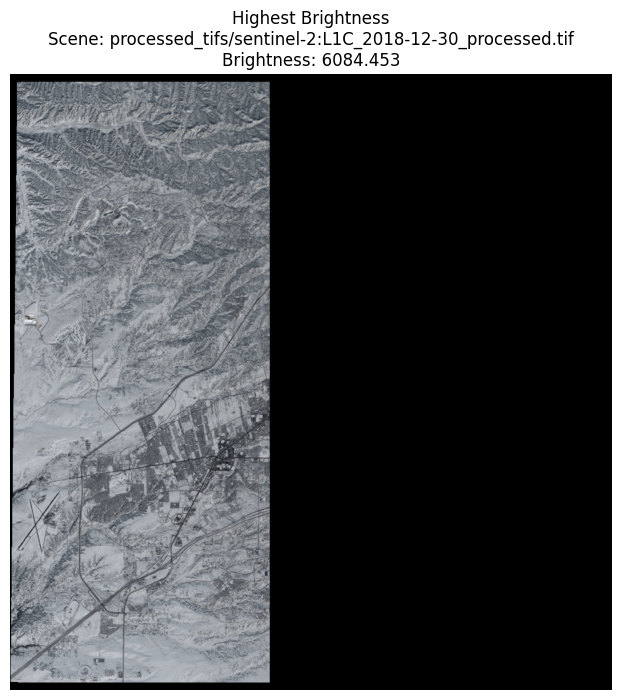

In [ ]:
max_brightness = -np.inf
max_brightness_file = None

pbar = tqdm(file_list, desc="Processing files", unit="file")
for fp in pbar:
    brightness = compute_overall_brightness(fp)
    pbar.set_postfix({"Brightness": f"{brightness:.3f}"})
    if brightness > max_brightness:
        max_brightness = brightness
        max_brightness_file = fp
pbar.close()


print(f"\nScene with the highest overall brightness: {max_brightness_file} (Brightness = {max_brightness:.3f})")
plot_scene_rgb(max_brightness_file, title=f"Highest Brightness\nScene: {max_brightness_file}\nBrightness: {max_brightness:.3f}")

# Task 6: Temporal Composites

In [ ]:
def load_stack_with_alpha(directory, file_pattern="*.tif", apply_mask=True, cloud_threshold=8000):
    """
    Loads a stack of images from the given directory, including spectral bands and the alpha channel.

    Parameters:
        directory: str
            Path to the directory containing the GeoTIFF files.
        file_pattern: str
            Pattern to match files (default: "*.tif").
        apply_mask: bool
            Whether to apply a cloud mask using a threshold (default: True).
        cloud_threshold: int
            Pixel value threshold to mask out high-reflectance clouds.

    Returns:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width) (validity mask)
        files: List of file paths used in the stack
    """
    file_list = sorted(glob.glob(os.path.join(directory, file_pattern)))

    if not file_list:
        raise ValueError(f"No files found in {directory} matching pattern {file_pattern}")

    # Read first file to determine dimensions
    with rasterio.open(file_list[0]) as ds:
        n_bands = ds.count - 1 if ds.count > 1 else ds.count  # Exclude alpha if present
        height, width = ds.height, ds.width

    # Initialize stacks
    stack = np.empty((len(file_list), n_bands, height, width), dtype=np.float32)
    alpha_stack = np.empty((len(file_list), height, width), dtype=np.uint8)

    # Load images
    for i, file in enumerate(file_list):
        with rasterio.open(file) as ds:
            # Read spectral bands (ignoring the alpha band for now)
            img = ds.read(out_dtype=np.float32)  # shape: (bands, height, width)

            # If an alpha channel exists, extract it
            if ds.count > n_bands:  # Assuming alpha is the last band
                alpha_band = ds.read(ds.count).astype(np.uint8)  # shape: (height, width)
            else:
                alpha_band = np.ones((height, width), dtype=np.uint8)  # Default to fully valid

            # Apply cloud masking if enabled
            if apply_mask:
                cloud_mask = (img[0] > cloud_threshold)  # Example: Using Band 1 as a cloud indicator
                img[:, cloud_mask] = np.nan  # Set cloud pixels to NaN
                alpha_band[cloud_mask] = 0  # Mark clouds as invalid

            stack[i] = img[:n_bands]  # Store only spectral bands
            alpha_stack[i] = alpha_band  # Store the alpha mask

    return stack, alpha_stack, file_list




def compute_ndvi(stack):
    """
    Computes NDVI for each image in the stack.

    NDVI = (NIR - Red) / (NIR + Red)

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)

    Returns:
        NDVI array of shape (n_images, height, width)
    """
    nir_band = stack[:, 3, :, :]  # Assuming Band 4 is NIR
    red_band = stack[:, 0, :, :]  # Assuming Band 1 is Red
    ndvi = (nir_band - red_band) / (nir_band + red_band + 1e-6)  # Avoid division by zero
    return ndvi



def composite_mean(stack):
    """Computes the pixel‐wise mean composite (ignoring NaNs)."""
    with np.errstate(invalid='ignore'):
        return np.nanmean(stack, axis=0)



def composite_median(stack, alpha_stack):
    """
    Computes the Median Pixel Composite while ensuring cloud and NoData areas are ignored.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width), representing valid pixels

    Returns:
        Composite image of shape (n_bands, height, width)
    """
    n_images, n_bands, height, width = stack.shape

    # Expand alpha_stack to match stack shape (so it can be applied across bands)
    alpha_stack = np.expand_dims(alpha_stack, axis=1)  # Shape: (n_images, 1, height, width)

    # Mask out invalid pixels (set to NaN where alpha == 0)
    stack = np.where(alpha_stack > 0, stack, np.nan)

    # Compute the median value at each pixel location, ignoring NaNs
    composite = np.nanmedian(stack, axis=0)  # Shape: (n_bands, height, width)

    return composite



def composite_minimum(stack, alpha_stack):
    """
    Computes the Minimum Pixel Composite by selecting the darkest pixel at each location
    across all time steps. Ensures clouds are excluded using the alpha mask.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width), representing valid pixels

    Returns:
        Composite image of shape (n_bands, height, width)
    """
    n_images, n_bands, height, width = stack.shape

    # Expand alpha_stack to match stack shape
    alpha_stack = np.expand_dims(alpha_stack, axis=1)  # Shape: (n_images, 1, height, width)

    # Mask out invalid pixels (set to NaN where alpha == 0)
    stack = np.where(alpha_stack > 0, stack, np.nan)

    # Apply stricter filtering to remove any remaining cloud influence
    stack_filtered = np.where(stack > 100, stack, np.nan)  # Ignore very low outliers (potential clouds)

    # Compute the minimum pixel value at each location (ignoring NaNs)
    composite = np.nanmin(stack_filtered, axis=0)  # Shape: (n_bands, height, width)

    return composite



def composite_max(stack):
    """
    Computes a refined maximum composite by:
    - Prioritizing pixels with high NDVI (to reduce cloud contamination)
    - Using the 98th percentile instead of raw max to avoid extreme outliers
    - Ensuring consistent spectral selection across bands

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)

    Returns:
        Maximum composite image of shape (n_bands, height, width)
    """
    ndvi_stack = compute_ndvi(stack)

    # Replace NaNs with -infinity to avoid issues with nanargmax
    ndvi_filled = np.where(np.isnan(ndvi_stack), -np.inf, ndvi_stack)
    argmax_idx = np.nanargmax(ndvi_filled, axis=0)  # Get the index of max NDVI value per pixel

    n_bands, height, width = stack.shape[1], stack.shape[2], stack.shape[3]
    composite = np.empty((n_bands, height, width), dtype=stack.dtype)

    ii, jj = np.indices((height, width))
    for b in range(n_bands):
        composite[b, :, :] = stack[:, b, :, :][argmax_idx, ii, jj]  # Select bands from max NDVI timestamp

    # Apply percentile-based max filtering to reduce extreme values
    percentile_98 = np.nanpercentile(composite, 98, axis=(1, 2), keepdims=True)
    composite = np.minimum(composite, percentile_98)  # Clip extreme values at the 98th percentile

    return composite



def composite_greenest(stack):
    """
    Computes the greenest pixel composite using NDVI instead of raw green reflectance.
    For each pixel, selects the image with the highest NDVI value and returns its full spectral vector.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)

    Returns:
        Greenest pixel composite of shape (n_bands, height, width)
    """
    ndvi_stack = compute_ndvi(stack)
    # Replace NaNs with -infinity to avoid issues with nanargmax
    ndvi_filled = np.where(np.isnan(ndvi_stack), -np.inf, ndvi_stack)
    argmax_idx = np.nanargmax(ndvi_filled, axis=0)  # shape: (height, width)

    n_bands, height, width = stack.shape[1], stack.shape[2], stack.shape[3]
    composite = np.empty((n_bands, height, width), dtype=stack.dtype)

    ii, jj = np.indices((height, width))
    for b in range(n_bands):
        composite[b, :, :] = stack[:, b, :, :][argmax_idx, ii, jj]

    return composite



def composite_medoid(stack, alpha_stack):
    """
    Computes the medoid composite while handling partial composites using the alpha channel.
    If no valid data is available for a pixel, falls back to the median composite.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width), representing the alpha mask (valid pixels)

    Returns:
        Medoid composite of shape (n_bands, height, width)
    """
    n_images, n_bands, height, width = stack.shape

    # Ensure no fully masked pixels exist (use only valid pixels based on alpha mask)
    valid_pixels = np.any(alpha_stack > 0, axis=0)  # True where at least one image has a valid pixel

    # Compute the median spectrum, ignoring NaNs but ensuring at least one valid value
    median_spectrum = np.full((n_bands, height, width), np.nan, dtype=stack.dtype)

    for b in range(n_bands):
        median_spectrum[b][valid_pixels] = np.nanmedian(stack[:, b, :, :][:, valid_pixels], axis=0)

    # Compute Euclidean distance from the median spectrum
    distances = np.full((n_images, height, width), np.inf, dtype=np.float32)

    for i in range(n_images):
        diff = stack[i] - median_spectrum  # Shape: (n_bands, height, width)
        distances[i][valid_pixels] = np.sqrt(np.nansum(diff[:, valid_pixels] ** 2, axis=0))  # Compute only for valid pixels

    # Find the index of the image with the smallest distance per pixel
    argmin_idx = np.nanargmin(distances, axis=0)  # Shape: (height, width)

    # Construct the medoid composite by selecting the best match per pixel
    composite = np.full((n_bands, height, width), np.nan, dtype=stack.dtype)
    ii, jj = np.indices((height, width))

    for b in range(n_bands):
        composite[b, :, :][valid_pixels] = stack[:, b, :, :][argmin_idx, ii, jj][valid_pixels]

    # Fill remaining NaNs with the median composite
    nan_mask = np.isnan(composite)
    composite[nan_mask] = median_spectrum[nan_mask]  # Fallback for missing pixels

    return composite



def composite_85_greenest(stack, alpha_stack, percentile=85):
    """
    Computes an 85% Greenest Pixel Composite by selecting the top 15% most green
    pixels (Band 2) and computing the median of that subset.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width), representing valid pixels
        percentile: int (default: 85)
            The percentile threshold for selecting the greenest pixels.

    Returns:
        Composite image of shape (n_bands, height, width)
    """
    n_images, n_bands, height, width = stack.shape

    # Extract the green band (Band 2) and sort it along the time axis in descending order
    green_stack = stack[:, 1, :, :]  # Band 2 (Green)
    valid_pixels = np.any(alpha_stack > 0, axis=0)  # Pixels with at least one valid value

    # Sort in descending order and select the top 15% most green values
    sorted_indices = np.argsort(-green_stack, axis=0)  # Negative sign to sort descending
    top_15_count = max(1, int(n_images * (percentile / 100.0)))  # At least one pixel selected

    # Compute the median of the selected subset
    composite = np.full((n_bands, height, width), np.nan, dtype=stack.dtype)
    ii, jj = np.indices((height, width))

    for b in range(n_bands):
        top_values = stack[:, b, :, :][sorted_indices[:top_15_count], ii, jj]  # Select top 15% pixels
        composite[b, :, :][valid_pixels] = np.nanmedian(top_values[:, valid_pixels], axis=0)

    return composite


def composite_25_minimum(stack, alpha_stack, percentile=25):
    """
    Computes a 25% Minimum Pixel Composite by selecting the bottom 25% darkest pixels
    and computing the median of that subset. Ensures clouds are excluded using the alpha mask.

    Parameters:
        stack: NumPy array of shape (n_images, n_bands, height, width)
        alpha_stack: NumPy array of shape (n_images, height, width), representing valid pixels
        percentile: int (default: 25)
            The percentile threshold for selecting the darkest pixels.

    Returns:
        Composite image of shape (n_bands, height, width)
    """
    n_images, n_bands, height, width = stack.shape

    # Fix shape issue: Expand alpha_stack to have a band dimension
    alpha_stack = np.expand_dims(alpha_stack, axis=1)  # Shape: (n_images, 1, height, width)

    # Mask out invalid pixels (set to NaN where alpha == 0)
    stack = np.where(alpha_stack > 0, stack, np.nan)

    # Ensure at least one valid pixel exists
    valid_pixels = np.any(~np.isnan(stack), axis=0)

    # Initialize composite with NaNs
    composite = np.full((n_bands, height, width), np.nan, dtype=stack.dtype)

    # Iterate through bands
    for b in range(n_bands):
        band_stack = stack[:, b, :, :]  # Extract individual band across time

        # Sort pixel values in ascending order (ignoring NaNs)
        sorted_indices = np.argsort(band_stack, axis=0)

        # Select bottom 25% (ensuring at least one valid observation per pixel)
        bottom_25_count = max(1, int(n_images * (percentile / 100.0)))

        # Extract the bottom 25% of pixel values for each pixel location
        bottom_values = np.take_along_axis(band_stack, sorted_indices[:bottom_25_count], axis=0)

        # Compute the median of the bottom 25% values for valid pixels only
        bottom_values_reshaped = bottom_values.reshape(bottom_25_count, -1)  # Flatten
        median_bottom = np.nanmedian(bottom_values_reshaped, axis=0)  # Compute median
        composite[b, :, :] = median_bottom.reshape(height, width)  # Reshape back

    return composite


def plot_composite_rgb(composite, title=None):
    """
    Plots an RGB composite image using Bands 1 (Red), 2 (Green), and 3 (Blue)
    from the composite array (shape: [n_bands, height, width]).
    """
    def normalize(arr):
        arr_min, arr_max = np.nanmin(arr), np.nanmax(arr)
        return (arr - arr_min) / (arr_max - arr_min + 1e-6)

    rgb = np.dstack([normalize(composite[0]), normalize(composite[1]), normalize(composite[2])])  # R, G, B
    plt.figure(figsize=(8, 8))
    plt.imshow(rgb)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

## 6.1 - Mean

<ipython-input-23-372536bdce5c>:53: RuntimeWarning: Mean of empty slice
  return np.nanmean(stack, axis=0)


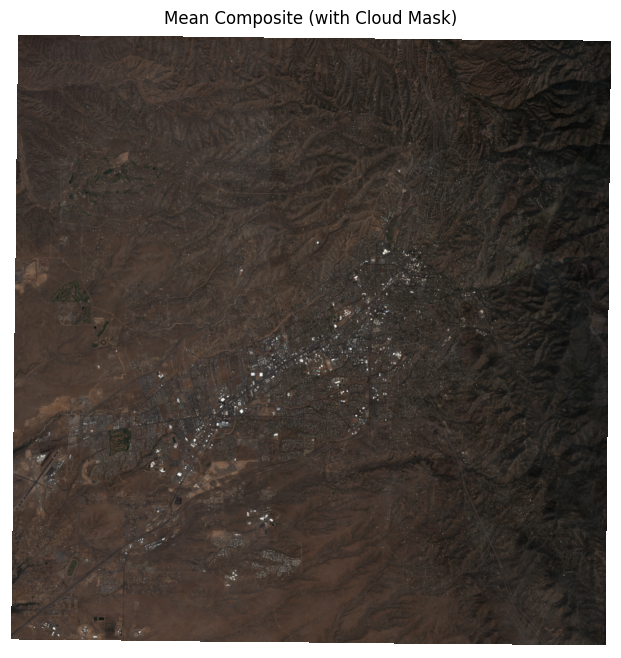

In [ ]:
stack, alpha_stack, files = load_stack_with_alpha("processed_tifs", file_pattern="*_processed.tif", apply_mask=True, cloud_threshold=8000)
mean_composite = composite_mean(stack)
plot_composite_rgb(mean_composite, title="Mean Composite (with Cloud Mask)")

## 6.2 - Median

<ipython-input-7-557bc1214aef>:24: RuntimeWarning: All-NaN slice encountered
  composite = np.nanmedian(stack, axis=0)  # Shape: (n_bands, height, width)


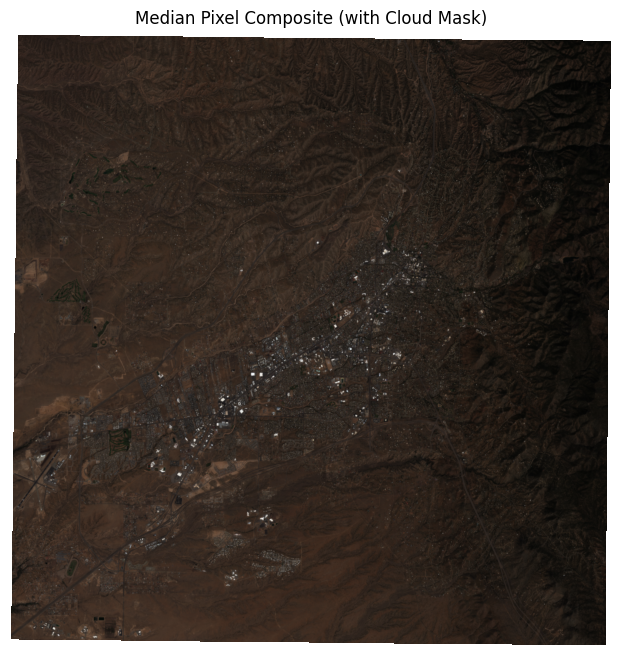

In [ ]:
median_composite = composite_median(stack, alpha_stack)
plot_composite_rgb(median_composite, title="Median Pixel Composite (with Cloud Mask)")

## 6.3 - Minimum

<ipython-input-26-d6f9592cb2f9>:28: RuntimeWarning: All-NaN slice encountered
  composite = np.nanmin(stack_filtered, axis=0)  # Shape: (n_bands, height, width)


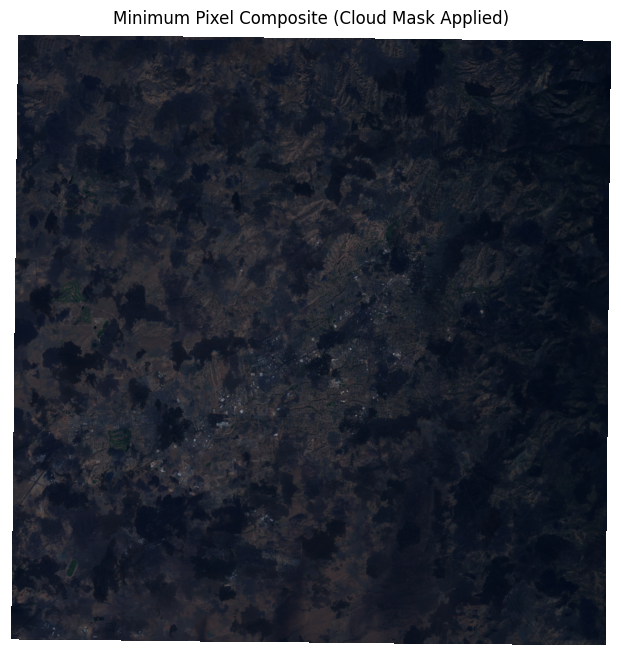

In [ ]:
min_composite = composite_minimum(stack, alpha_stack)
plot_composite_rgb(min_composite, title="Minimum Pixel Composite (Cloud Mask Applied)")

## 6.4 - Maximum

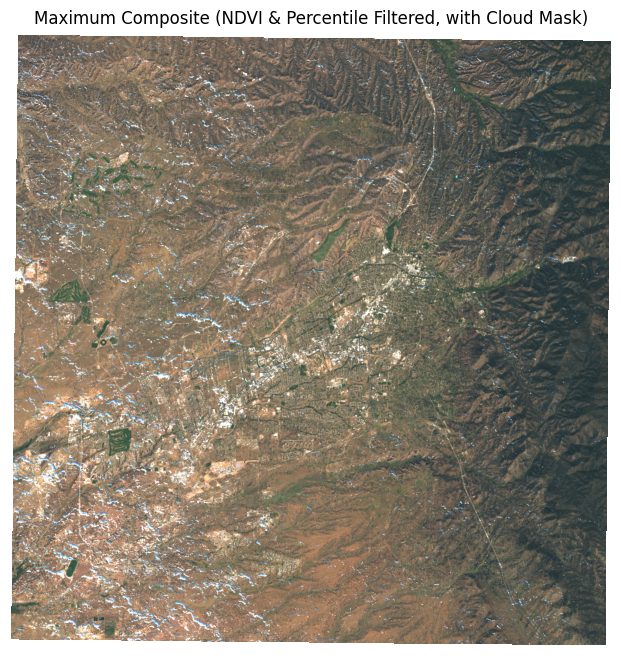

In [ ]:
max_composite_optimized = composite_max(stack)
plot_composite_rgb(max_composite_optimized, title="Maximum Composite (NDVI & Percentile Filtered, with Cloud Mask)")

## 6.5 - Greenest Pixel

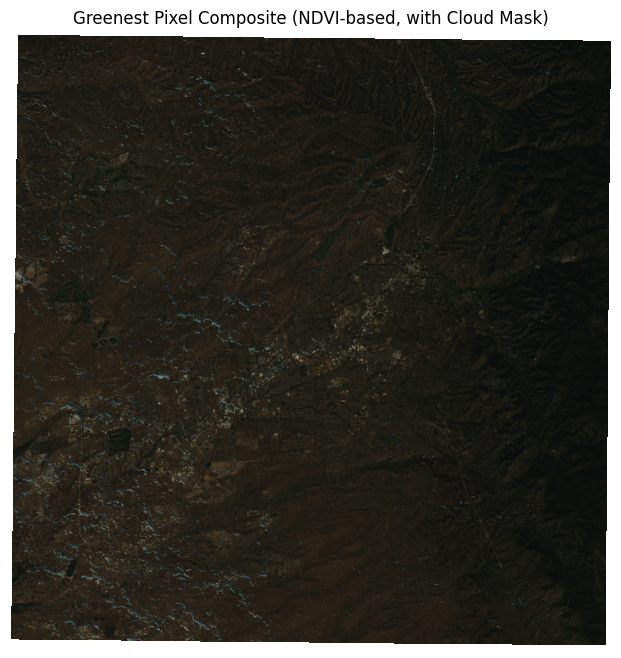

In [ ]:
greenest_composite_ndvi = composite_greenest(stack)
plot_composite_rgb(greenest_composite_ndvi, title="Greenest Pixel Composite (NDVI-based, with Cloud Mask)")

## 6.5 - Medoid

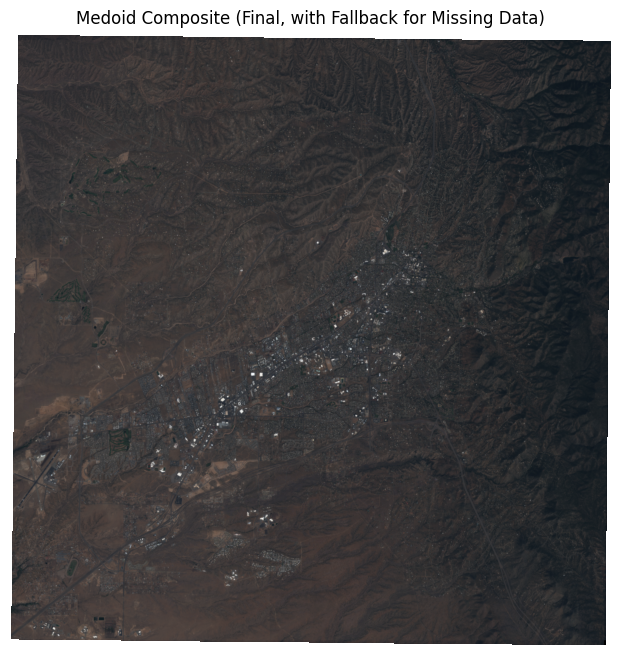

In [ ]:
medoid_composite_fallback = composite_medoid(stack, alpha_stack)
plot_composite_rgb(medoid_composite_fallback, title="Medoid Composite (Final, with Fallback for Missing Data)")

## 6.6 - 85% Greenest Pixel




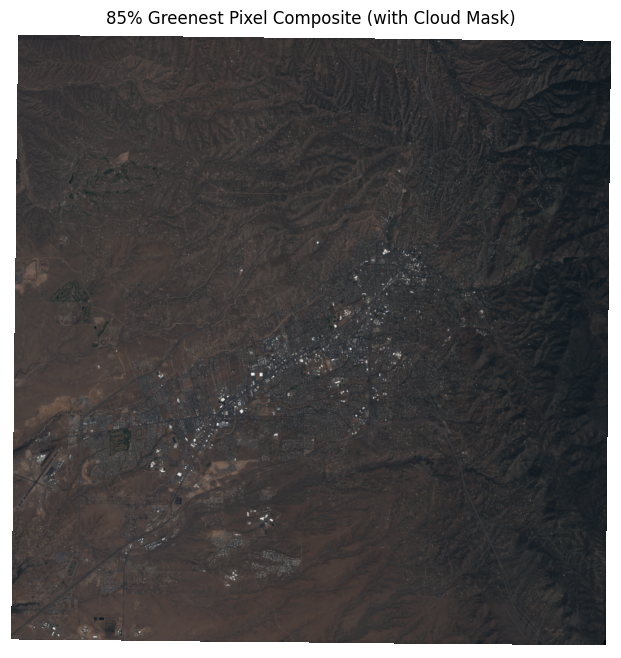

In [ ]:
greenest_85_composite = composite_85_greenest(stack, alpha_stack)
plot_composite_rgb(greenest_85_composite, title="85% Greenest Pixel Composite (with Cloud Mask)")

## 6.7 - 25% Minimum Pixel

<ipython-input-22-119141a794ab>:47: RuntimeWarning: All-NaN slice encountered
  median_bottom = np.nanmedian(bottom_values_reshaped, axis=0)  # Compute median


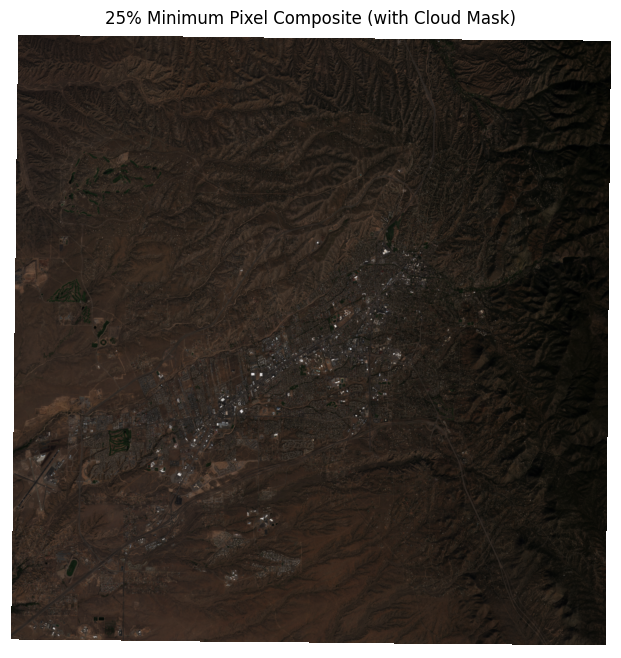

In [ ]:
min_25_composite = composite_25_minimum(stack, alpha_stack)
plot_composite_rgb(min_25_composite, title="25% Minimum Pixel Composite (with Cloud Mask)")